### Importação dos dados



In [2]:
import pandas as pd

url = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science/refs/heads/main/base-de-dados-challenge-1/loja_1.csv"
url2 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science/refs/heads/main/base-de-dados-challenge-1/loja_2.csv"
url3 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science/refs/heads/main/base-de-dados-challenge-1/loja_3.csv"
url4 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science/refs/heads/main/base-de-dados-challenge-1/loja_4.csv"

loja = pd.read_csv(url)
loja2 = pd.read_csv(url2)
loja3 = pd.read_csv(url3)
loja4 = pd.read_csv(url4)

loja.head()

,Produto,Categoria do Produto,Preço,Frete,Data da Compra,Vendedor,Local da compra,Avaliação da compra,Tipo de pagamento,Quantidade de parcelas,lat,lon
0,Assistente virtual,eletronicos,219.08,9.249790,16/01/2021,Pedro Gomes,SP,4,cartao_credito,8,-22.19,-48.79
1,Mesa de jantar,moveis,256.35,11.234305,18/05/2022,Beatriz Moraes,RJ,1,cartao_credito,4,-22.25,-42.66
2,Jogo de tabuleiro,brinquedos,279.51,21.262681,15/03/2021,João Souza,DF,1,cartao_credito,1,-15.83,-47.86
3,Micro-ondas,eletrodomesticos,1009.99,54.667344,03/05/2022,João Souza,RS,4,boleto,1,-30.17,-53.50
4,Cadeira de escritório,moveis,446.99,26.964689,07/11/2020,Larissa Alves,MG,5,boleto,1,-18.10,-44.38


#1. Análise do faturamento


In [3]:

faturamento1 = loja['Preço'].sum()
faturamento2 = loja2['Preço'].sum()
faturamento3 = loja3['Preço'].sum()
faturamento4 = loja4['Preço'].sum()


print(f"Faturamento Loja 1: R$ {faturamento1:.2f}")
print(f"Faturamento Loja 2: R$ {faturamento2:.2f}")
print(f"Faturamento Loja 3: R$ {faturamento3:.2f}")
print(f"Faturamento Loja 4: R$ {faturamento4:.2f}")


faturamento = pd.DataFrame({
    'Loja': ['Loja 1', 'Loja 2', 'Loja 3', 'Loja 4'],
    'Faturamento (R$)': [faturamento1, faturamento2, faturamento3, faturamento4]
})

faturamento

Faturamento Loja 1: R$ 1534509.12
Faturamento Loja 2: R$ 1488459.06
Faturamento Loja 3: R$ 1464025.03
Faturamento Loja 4: R$ 1384497.58


,Loja,Faturamento (R$)
0,Loja 1,1534509.12
1,Loja 2,1488459.06
2,Loja 3,1464025.03
3,Loja 4,1384497.58


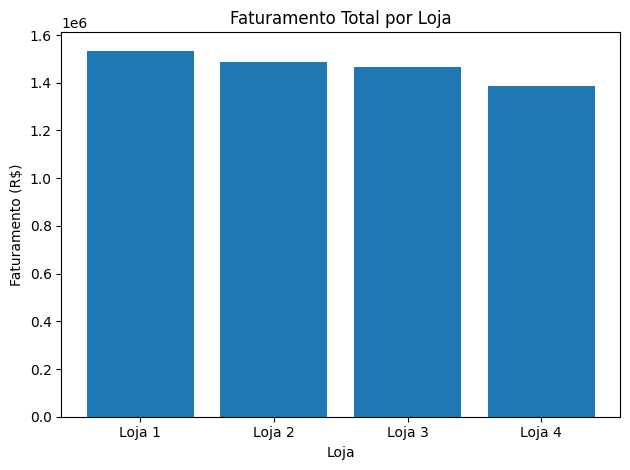

In [4]:
import matplotlib.pyplot as plt

plt.figure()
plt.bar(faturamento['Loja'], faturamento['Faturamento (R$)'])
plt.title('Faturamento Total por Loja')
plt.xlabel('Loja')
plt.ylabel('Faturamento (R$)')
plt.tight_layout()
plt.show()

# 2. Vendas por Categoria


In [5]:
# 2.1 Adicionar coluna identificando a loja
loja['Loja']  = 'Loja 1'
loja2['Loja'] = 'Loja 2'
loja3['Loja'] = 'Loja 3'
loja4['Loja'] = 'Loja 4'

# 2.2 Concatenar tudo num único DataFrame
df_all = pd.concat([loja, loja2, loja3, loja4], ignore_index=True)

# 2.3 Pivot: linhas = Loja, colunas = Categoria, valores = contagem de vendas
vendas_cat = df_all.groupby(['Loja','Categoria do Produto']) \
                   .size() \
                   .unstack(fill_value=0)
vendas_cat

Categoria do Produto,brinquedos,eletrodomesticos,eletronicos,esporte e lazer,instrumentos musicais,livros,moveis,utilidades domesticas
Loja,,,,,,,,
Loja 1,324,312,448,284,182,173,465,171
Loja 2,313,305,422,275,224,197,442,181
Loja 3,315,278,451,277,177,185,499,177
Loja 4,338,254,451,277,170,187,480,201


<Figure size 800x500 with 0 Axes>

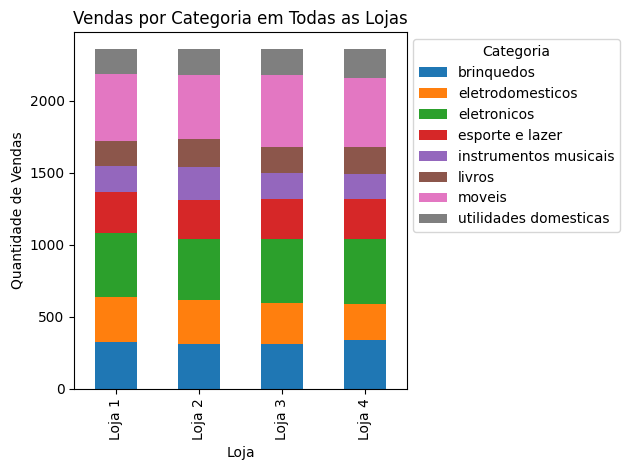

In [6]:
plt.figure(figsize=(8,5))
vendas_cat.plot(kind='bar', stacked=True)
plt.title('Vendas por Categoria em Todas as Lojas')
plt.xlabel('Loja')
plt.ylabel('Quantidade de Vendas')
plt.legend(title='Categoria', bbox_to_anchor=(1,1))
plt.tight_layout()
plt.show()

# 3. Média de Avaliação das Lojas

In [7]:

media1 = loja['Avaliação da compra'].mean()
media2 = loja2['Avaliação da compra'].mean()
media3 = loja3['Avaliação da compra'].mean()
media4 = loja4['Avaliação da compra'].mean()

print(f"Avaliação média Loja 1: {media1:.2f}")
print(f"Avaliação média Loja 2: {media2:.2f}")
print(f"Avaliação média Loja 3: {media3:.2f}")
print(f"Avaliação média Loja 4: {media4:.2f}")

media_avaliacao = pd.DataFrame({
    'Loja': ['Loja 1', 'Loja 2', 'Loja 3', 'Loja 4'],
    'Avaliação Média': [media1, media2, media3, media4]
})
media_avaliacao

Avaliação média Loja 1: 3.98
Avaliação média Loja 2: 4.04
Avaliação média Loja 3: 4.05
Avaliação média Loja 4: 4.00


,Loja,Avaliação Média
0,Loja 1,3.976685
1,Loja 2,4.037304
2,Loja 3,4.048326
3,Loja 4,3.995759


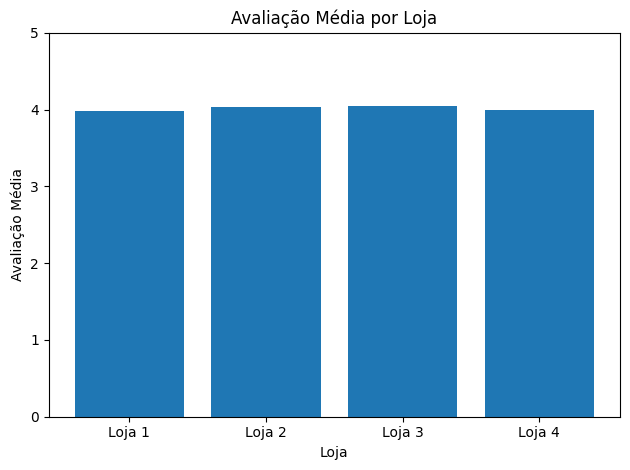

In [8]:
import matplotlib.pyplot as plt

plt.figure()
plt.bar(media_avaliacao['Loja'], media_avaliacao['Avaliação Média'])
plt.title('Avaliação Média por Loja')
plt.xlabel('Loja')
plt.ylabel('Avaliação Média')
plt.ylim(0,5)
plt.tight_layout()
plt.show()

# 4. Produtos Mais e Menos Vendidos


=== Loja 1 ===
Top 5 Produtos Mais Vendidos:
 Produto
Micro-ondas           60
TV Led UHD 4K         60
Guarda roupas         60
Secadora de roupas    58
Cômoda                56
Name: count, dtype: int64

Top 5 Produtos Menos Vendidos:
 Produto
Ciência de dados com python    39
Pandeiro                       36
Panela de pressão              35
Headset                        33
Celular ABXY                   33
Name: count, dtype: int64


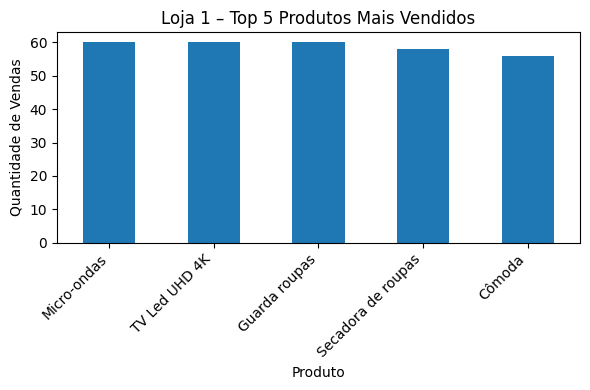

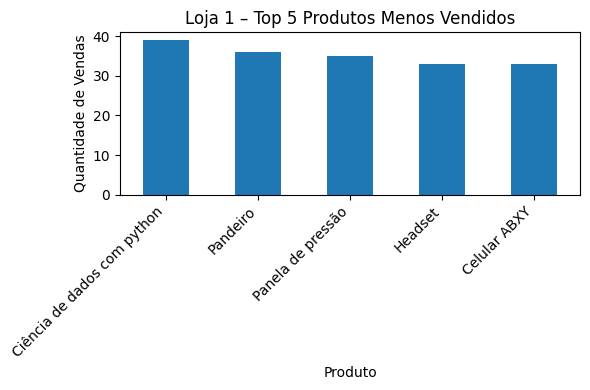


=== Loja 2 ===
Top 5 Produtos Mais Vendidos:
 Produto
Iniciando em programação    65
Micro-ondas                 62
Bateria                     61
Violão                      58
Pandeiro                    58
Name: count, dtype: int64

Top 5 Produtos Menos Vendidos:
 Produto
Fone de ouvido       37
Poltrona             35
Mesa de jantar       34
Impressora           34
Jogo de tabuleiro    32
Name: count, dtype: int64


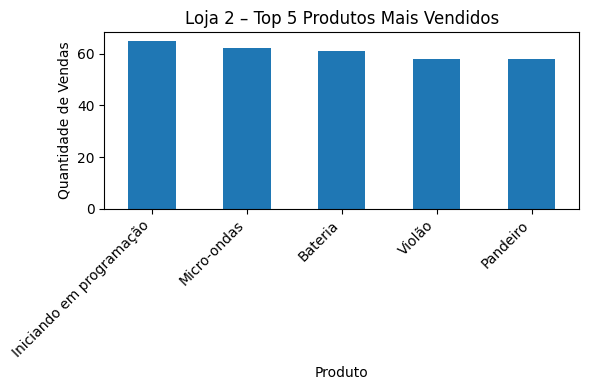

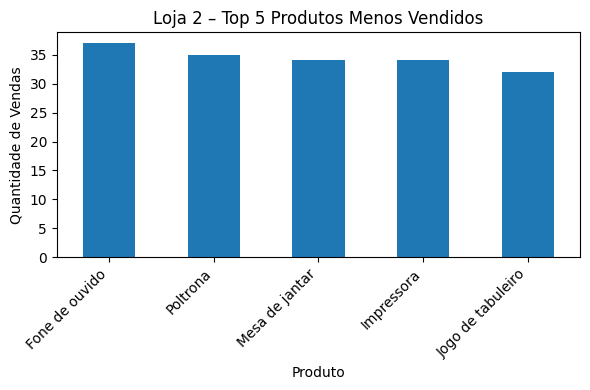


=== Loja 3 ===
Top 5 Produtos Mais Vendidos:
 Produto
Kit banquetas      57
Mesa de jantar     56
Cama king          56
Jogo de panelas    55
Cômoda             55
Name: count, dtype: int64

Top 5 Produtos Menos Vendidos:
 Produto
Guitarra            38
Jogo de copos       36
Mochila             36
Micro-ondas         36
Blocos de montar    35
Name: count, dtype: int64


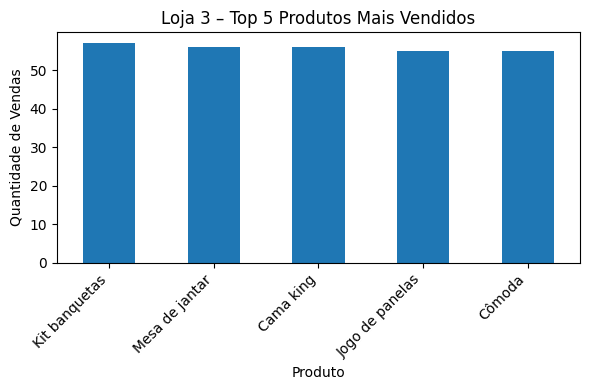

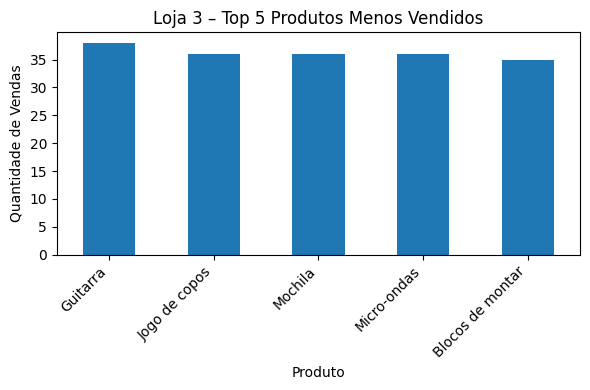


=== Loja 4 ===
Top 5 Produtos Mais Vendidos:
 Produto
Cama box                    62
Faqueiro                    59
Dashboards com Power BI     56
Cama king                   56
Carrinho controle remoto    55
Name: count, dtype: int64

Top 5 Produtos Menos Vendidos:
 Produto
Geladeira                      38
Ciência de dados com python    38
Violão                         37
Guarda roupas                  34
Guitarra                       33
Name: count, dtype: int64


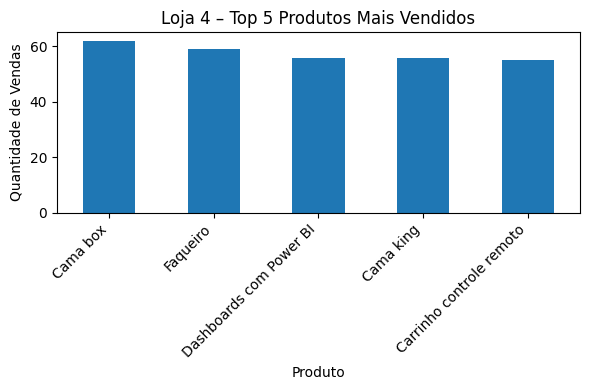

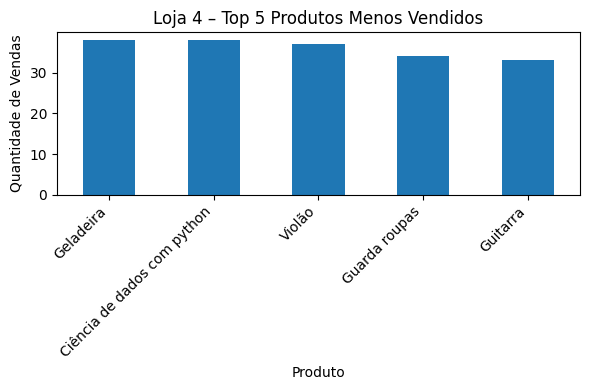

In [9]:
import matplotlib.pyplot as plt


lojas = [
    (loja,  'Loja 1'),
    (loja2, 'Loja 2'),
    (loja3, 'Loja 3'),
    (loja4, 'Loja 4'),
]

for df, nome in lojas:
    contagem = df['Produto'].value_counts()
    top5    = contagem.head(5)
    bot5    = contagem.tail(5)
    
    
    print(f"\n=== {nome} ===")
    print("Top 5 Produtos Mais Vendidos:\n", top5)
    print("\nTop 5 Produtos Menos Vendidos:\n", bot5)
    

    plt.figure(figsize=(6,4))
    top5.plot(kind='bar')
    plt.title(f"{nome} – Top 5 Produtos Mais Vendidos")
    plt.ylabel("Quantidade de Vendas")
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()
    
    
    plt.figure(figsize=(6,4))
    bot5.plot(kind='bar')
    plt.title(f"{nome} – Top 5 Produtos Menos Vendidos")
    plt.ylabel("Quantidade de Vendas")
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

# 5. Frete Médio por Loja


In [10]:

frete1 = loja['Frete'].mean()
frete2 = loja2['Frete'].mean()
frete3 = loja3['Frete'].mean()
frete4 = loja4['Frete'].mean()

print(f"Frete médio Loja 1: R$ {frete1:.2f}")
print(f"Frete médio Loja 2: R$ {frete2:.2f}")
print(f"Frete médio Loja 3: R$ {frete3:.2f}")
print(f"Frete médio Loja 4: R$ {frete4:.2f}")


frete_medio = pd.DataFrame({
    'Loja': ['Loja 1','Loja 2','Loja 3','Loja 4'],
    'Frete Médio (R$)': [frete1, frete2, frete3, frete4]
})
frete_medio

Frete médio Loja 1: R$ 34.69
Frete médio Loja 2: R$ 33.62
Frete médio Loja 3: R$ 33.07
Frete médio Loja 4: R$ 31.28


,Loja,Frete Médio (R$)
0,Loja 1,34.691805
1,Loja 2,33.621941
2,Loja 3,33.074464
3,Loja 4,31.278997


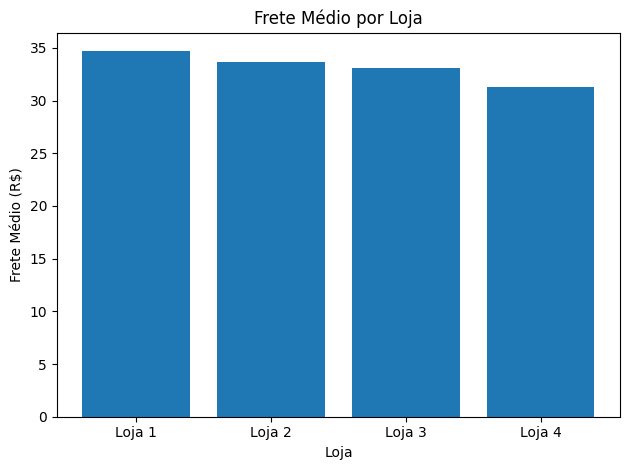

In [11]:
import matplotlib.pyplot as plt

plt.figure()
plt.bar(frete_medio['Loja'], frete_medio['Frete Médio (R$)'])
plt.title('Frete Médio por Loja')
plt.xlabel('Loja')
plt.ylabel('Frete Médio (R$)')
plt.tight_layout()
plt.show()

### Distribuição Geográfica

In [13]:
import folium

# centrar no centro aproximado dos dados
centro = [df_all['lat'].mean(), df_all['lon'].mean()]
m = folium.Map(location=centro, zoom_start=5)

for _, row in df_all.iterrows():
    folium.CircleMarker(
        location=[row['lat'], row['lon']],
        radius=3,
        popup=f"{row['Loja']} – R$ {row['Preço']:.2f}",
        fill=True, fill_opacity=0.6
    ).add_to(m)

m 